In [1]:
#####Jupyter Stuff#####
import IPython
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
from ipywidgets import IntProgress,IntText,FloatText
from IPython.display import display,clear_output
from tqdm import notebook
import IPython.display
import matplotlib.pyplot as plt
#####Pytorch Stuff#####
import torch
import torch.nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
print('pytorch = ' + torch.__version__)
#setting GPU
torch.backends.cudnn.benchmark=True
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using GPU " + str(device))

from torch.cuda.amp import GradScaler, autocast
from contextlib import nullcontext
dtype = 'bfloat16' if torch.cuda.is_available() and torch.cuda.is_bf16_supported() else 'float16' # 'float32', 'bfloat16', or 'float16', the latter will auto implement a GradScaler
ptdtype = {'float32': torch.float32, 'bfloat16': torch.bfloat16, 'float16': torch.float16}[dtype]
ctx = nullcontext() if device == 'cpu' else torch.amp.autocast(device_type='cuda', dtype=ptdtype)
# initialize a GradScaler. If enabled=False scaler is a no-op
# scaler = torch.cuda.amp.GradScaler(enabled=(dtype == 'float16'))
scaler = GradScaler()

#####Vanilla Python Stuff
import os
import pathlib
import math
import random
import numpy as np
from qbstyles import mpl_style
from util import play_audio, plot_waveform, plot_spectrum, plot_waterfall_spectrum

import librosa

mpl_style(True)
# Dataset
epoch_sz = 256     # files per epoch
batch_sz = 128      # windows per batch
num_samp = 256      # input rx samples to model
aud_window_len = 32 # output audio samples from model

# Modulation
import modulation
from modulation import amplitude_modulate, demodulate_am
sr_mod = aud_window_len * 2**11 # 65,536
downsample = 8     # sr_mod / sr_aud
sr_aud: int = int(sr_mod // downsample)  # 8192  # sample_rate / 128
print(f'Modulation Rate: {sr_mod/1e3} kHz\nAudio Rate: {sr_aud/1e3} kHz')
carrier_freq = 0 # int(-sr_mod / 4) # negative b/c tuner adds positive offset, so signal appears at negative offset

C:\Users\coste\AppData\Local\Temp\ipykernel_14356\1073718747.py:3: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


pytorch = 2.2.0
Using GPU cuda:0
Modulation Rate: 65.536 kHz
Audio Rate: 8.192 kHz


In [2]:
def choose_random_frequency(sample_rate, freq_offset=0):
    spacing = 25e3
    n = math.floor(sample_rate / 2 / spacing)
    r = (np.arange(n*2 + 1) - n) * spacing
    r = np.delete(r, n) # remove zero
    r += freq_offset
    return random.choice(r)

def spread_frequency(f, spread=None):
    if spread is None:
        return f
    return f + random.random() * (spread * 2) - spread
random_shifted_freq = choose_random_frequency(sr_mod, carrier_freq)
s = spread_frequency(0, 100)
print(f"Random Shifted Frequency: {random_shifted_freq / 1e3} kHz")
print(f"Spread Frequency: {s} Hz")

Random Shifted Frequency: -25.0 kHz
Spread Frequency: -41.062516540568296 Hz


In [3]:
class AmDataset(Dataset):
    def __init__(self, directory, window_length, carrier_freq, sr_mod, sr_aud, carrier_spread=None, transform=None, max_files=None, max_windows=None, window_shift=None, snr_db=None, multi_signal=False, eval=False, device='cpu'):
        """
        Produces windowed segments of audio and amplitude-modulated signal. Each window is shifted by
        window_length // 2.
        Can add adjustable amount of noise and additional signals at other frequencies.
        Args:
        directory (str): Directory to be searched recursively for .wav files to sample from
        window_length (int): window length in audio samples.
        carrier_freq (float): Carrier frequency for amplitude modulation.
        modulated_sampling_rate (int): Sampling rate for modulation.
        audio_sampling_rate (int): Sampling rate for audio.
        transform (callable, optional): Optional transform to be applied on a sample.
        max_files (int, optional): If provided, take random sample of max_files files from the directory
        window_shift (int, optional): Interval between successive windows, default is window_length 
        snr_db (float, optional): The desired signal-to-noise ratio in decibels.
        multi_signal (bool, optional): Whether to include other signals at other random frequencies (within 2.5 Mhz)
        eval (bool, optional): 'pure' am signal not retruned if True
        """
        self.directory = directory
        self.window_length = window_length
        self.window_shift = window_length if window_shift is None else window_shift
        self.carrier_freq = carrier_freq
        self.carrier_spread = carrier_spread
        self.sr_mod = sr_mod
        self.sr_aud = sr_aud
        self.transform = transform
        self.snr_db = snr_db
        self.multi_signal = multi_signal
        self.device = device # use CPU to pre-fetch while GPU does forward/backward
        self.eval = eval
        # choose a random set of files from the samples dir
        path = pathlib.Path(directory)
        files = [f for f in path.rglob('*.wav')]
        if max_files is not None:
            self.files = random.sample(files, max_files)
        else:
            self.files = files
        
        # pre-compute data
        self.rx = torch.tensor([], device=self.device)
        self.audio = torch.tensor([], device=self.device)
        self.am = torch.tensor([], device=self.device) if not eval else None
        for f in self.files:
            self.process_file(f)
            if max_windows is not None and self.__len__() > max_windows:
                break

    def process_file(self, f):
        audio, _ = librosa.load(f, sr=self.sr_aud)
        # pad beginning so len(audio is even multiple of window length)
        target_len = math.ceil(len(audio) / self.window_length) * self.window_length
        padding_len = target_len - len(audio)
        # Convert to tensor, pad, and trim
        audio_tensor = torch.tensor(audio, dtype=torch.float32, device=self.device)
        audio_tensor = F.pad(audio_tensor, (padding_len, 0), 'constant', 0)
        # Modulate the audio segment
        am = amplitude_modulate(audio_tensor, self.carrier_freq, self.sr_aud, self.sr_mod, device=self.device)
        # Add frequency error to rx signal
        freq = spread_frequency(self.carrier_freq, self.carrier_spread)
        rx = amplitude_modulate(audio_tensor, freq, self.sr_aud, self.sr_mod, device=self.device)
        if self.snr_db is not None:
            # Calculate signal power
            signal_power = torch.mean(torch.abs(am) ** 2)
            # Calculate noise power based on randomized SNR between +40dB and snr_db
            snr = (random.random() * (40 - self.snr_db)) + self.snr_db
            noise_power = signal_power / (10 ** (snr / 10))
            # Generate noise with calculated noise power
            noise = torch.randn_like(am, dtype=am.dtype) * torch.sqrt(noise_power)
            # Add noise to the modulated signal
            rx = rx + noise
        # if self.multi_signal is not None and random.random() < self.multi_signal:
        #     # add another signal
        #     a, _ = librosa.load(random.choice(files), sr=self.sr_aud)
        #     t = torch.tensor(a, dtype=torch.float32, device=self.device)
        #     if t.shape[0] < audio_tensor.shape[0]:
        #         t = F.pad(t, (audio_tensor.shape[0] - t.shape[0], 0), 'constant', 0)
        #     elif t.shape[0] > audio_tensor.shape[0]:
        #         t = t[:audio_tensor.shape[0]]
        #     freq = choose_random_frequency(sr_mod, carrier_freq)
        #     freq = spread_frequency(freq, self.carrier_spread)
        #     # print(f'adding signal at {freq / 1e3:.2f}kHz')
        #     # start other signal at a random point in the window and last a random duration
        #     start_offset = random.randint(0, self.window_length)
        #     t[0:start_offset] = 0
        #     sig_len = random.randint(0, self.window_length - start_offset)
        #     t[start_offset + sig_len:] = 0
        #     # add other signal
        #     rx = rx + amplitude_modulate(t, freq, self.sr_aud, self.sr_mod, device=self.device)
        # normalize audio
        max_val = audio_tensor.abs().max()
        if max_val > 0:
            audio_tensor = audio_tensor / max_val
        self.audio = torch.cat((self.audio, audio_tensor))  # source audio
        self.rx = torch.cat((self.rx, rx))                  # rx signal with noise, other signals, etc
        if not self.eval:
            self.am = torch.cat((self.am, am))              # 'pure' am signal (only during training)

    def __len__(self):
        return 1 + (len(self.audio) - self.window_length) // self.window_shift

    def __getitem__(self, idx):
        # idx is in audio-window units
        # Calculate start and end indices for the audio segment
        # print(f'getting index {idx}')
        start = idx * self.window_shift
        end = start + self.window_length
        # print(f'audio ({start}:{end})')
        audio = self.audio[start:end]

        downsample = self.sr_mod // self.sr_aud
        start = int(start * downsample)
        end = int(end * downsample)
        # print(f'rx ({start}:{end})')
        rx = self.rx[start:end]
        am = self.am[start:end] if not self.eval else None
        if self.transform:
            audio = self.transform(audio)
            rx = self.transform(rx)
            am = self.transform(am)
        out = {'rx': rx, 'audio': audio}
        if not self.eval:
            out['am'] = am
        return out

Dataset len: 4092
Audio: torch.Size([32])
AM: torch.Size([256])
Rx: torch.Size([256])
4092.0


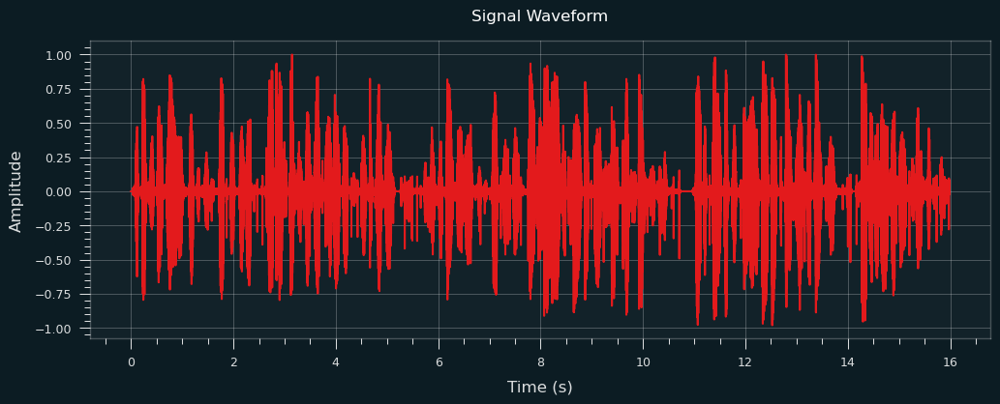

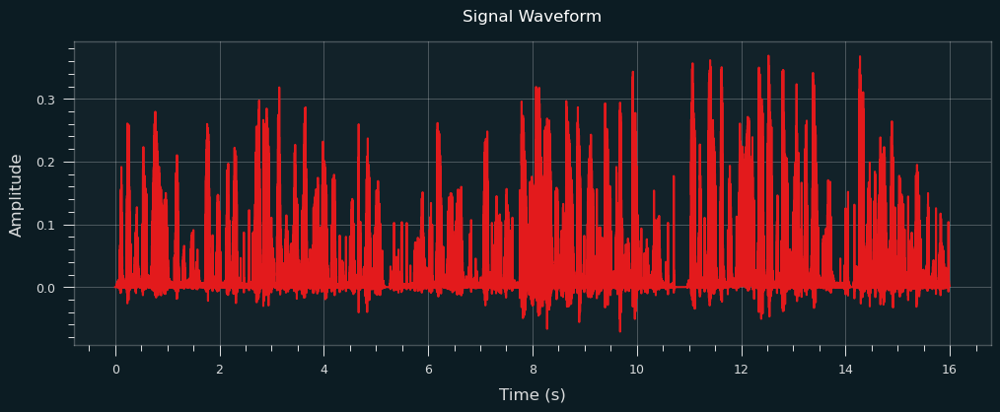

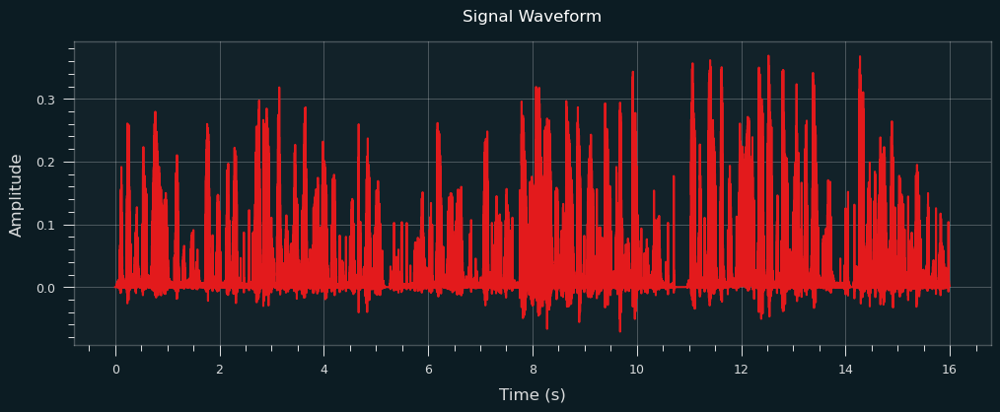

In [4]:
test_dir = os.path.join('audio','segments')
test_dataset = AmDataset(test_dir, 
                            aud_window_len,
                            carrier_freq,
                            sr_mod, sr_aud,
                            # max_files=1,
                            max_files=10,
                            max_windows=2144,
                            snr_db=None,
                            multi_signal=0,
                            eval=False,
                            device=device)
aud = torch.tensor([],device=device)
am = torch.tensor([],device=device)
rx = torch.tensor([],device=device)
print(f'Dataset len: {len(test_dataset)}')
print(f"Audio: {test_dataset[0]['audio'].shape}")
print(f"AM: {test_dataset[0]['am'].shape}")
print(f"Rx: {test_dataset[0]['rx'].shape}")
for i in range(len(test_dataset)):
    aud = torch.cat((aud, test_dataset[i]['audio']))
    am = torch.cat((am, test_dataset[i]['am']))
    rx = torch.cat((rx, test_dataset[i]['rx']))
print(aud.shape[0] / aud_window_len)
am_demod = demodulate_am(am, carrier_freq=carrier_freq, sample_rate=sr_mod, audio_sample_rate=sr_aud)
rx_demod = demodulate_am(rx, carrier_freq=carrier_freq, sample_rate=sr_mod, audio_sample_rate=sr_aud)
aud = aud.cpu().numpy()
am_demod = am_demod.cpu().numpy()
rx_demod = rx_demod.cpu().numpy()
plot_waveform(aud, sr_aud)
plot_waveform(am_demod, sr_aud)
plot_waveform(rx_demod, sr_aud)
IPython.display.display(play_audio(aud), play_audio(am_demod), play_audio(rx_demod))

In [5]:
print(test_dataset[0]['rx'].shape, test_dataset[0]['rx'].dtype)

torch.Size([256]) torch.complex64


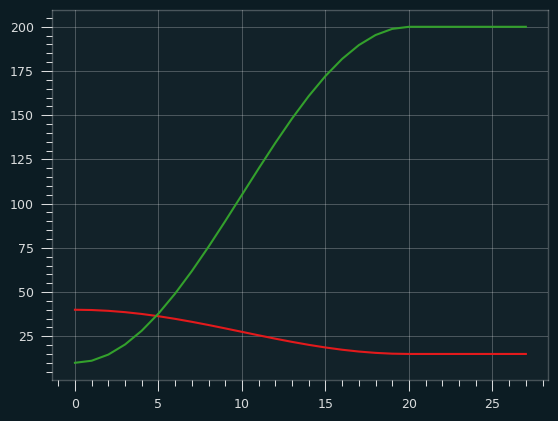

In [6]:
def cosine_annealing_schedule(epoch, final_epoch, initial_value, final_value):
    epoch = min(epoch, final_epoch) # flatten at final_snr
    cosine_decay = 0.5 * (1 + np.cos(np.pi * epoch / final_epoch))
    return final_value + (initial_value - final_value) * cosine_decay
# SNR schedule
initial_snr = 40
final_snr = 15
final_snr_epoch = 20
plt.plot([cosine_annealing_schedule(i, final_snr_epoch, initial_snr, final_snr) for i in range(final_snr_epoch+8)])

# Freq spread schedule
initial_spread = 10
final_spread = 200
final_spread_epoch = 20
plt.plot([cosine_annealing_schedule(i, final_spread_epoch, initial_spread, final_spread) for i in range(final_snr_epoch+8)])

In [7]:
import torch
import torch.nn as nn
from reformer_pytorch import Reformer
from dataclasses import dataclass
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding, bias): 
        super(ConvBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=kernel_size, padding=padding, bias=bias)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm1d(out_channels)
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.bn(out)
        out = self.relu(out)
        return out
    
class ConvUpsampleBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding, bias, activation=True):
        super(ConvUpsampleBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=kernel_size, padding=padding, bias=bias)
        self.bn = nn.BatchNorm1d(out_channels)
        self.relu = nn.LeakyReLU()
        self.activation = activation
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.bn(out)
        if self.activation:
            out = self.relu(out)
        return out

class PrintShape(nn.Module):
    def __init__(self, name=""):
        super(PrintShape, self).__init__()
        self.name = name

    def forward(self, x):
        print(f"Shape after {self.name}: {x.shape}")
        return x
@dataclass
class ModelConfig:
    # ConvBlock and ConvUpsampleBlock parameters
    in_channels: int = 2
    # Autoencoder params
    embedding_channels: int = 256
    encoder_conv_channels: list[int] = (128, 256, 256)
    decoder_conv_channels: list[int] = (128, 128, 64)
    conv_kernel_size: int = 13
    conv_padding: int = 6
    conv_bias: bool = False
    
    # Transformer parameters
    reformer_dim: int = 256
    reformer_depth: int = 2
    reformer_heads: int = 8
    lsh_dropout: float = 0.1
    causal: bool = True
    bucket_size: int = 4
    
    # Demodulator parameters
    demodulator_out: int = 1024
    demodulator_dropout: float = 0.2
    
    # General parameters
    input_samples: int = 1024  # Example input size
    n_out: int = 10  # Example output size
    debug: bool = False

class Analog(nn.Module):
    def __init__(self, config: ModelConfig, debug = False):
        super().__init__()
        self.config = config
        self.debug = debug

        self.encoder = nn.Sequential(
        ConvBlock(config.in_channels, 
                  config.encoder_conv_channels[0], 
                  config.conv_kernel_size, 6, False),
        PrintShape("conv1") if config.debug else nn.Identity(),
        nn.MaxPool1d(2),
        PrintShape("mp1") if config.debug else nn.Identity(),
        ConvBlock(config.encoder_conv_channels[0], 
                  config.encoder_conv_channels[1], 
                  config.conv_kernel_size, 6, False),
        PrintShape("conv2") if config.debug else nn.Identity(),
        nn.MaxPool1d(2),    
        PrintShape("mp2") if config.debug else nn.Identity(),
        ConvBlock(config.encoder_conv_channels[1], 
                  config.encoder_conv_channels[2], 
                  config.conv_kernel_size, 6, False),
        PrintShape("conv3") if config.debug else nn.Identity(),
        ConvBlock(config.encoder_conv_channels[2], 
                  config.embedding_channels, 
                  config.conv_kernel_size, 6, False),
        PrintShape("conv4") if config.debug else nn.Identity(),
        )
        # print(self.encoder)
        self.decoder = nn.Sequential(
        ConvUpsampleBlock(config.embedding_channels, 
                          config.decoder_conv_channels[0], 
                          config.conv_kernel_size, config.conv_padding, False),
        nn.Upsample(scale_factor=2),
        ConvUpsampleBlock(config.decoder_conv_channels[0], 
                          config.decoder_conv_channels[1], 
                          config.conv_kernel_size, config.conv_padding, True),
        nn.Upsample(scale_factor=2),
        ConvUpsampleBlock(config.decoder_conv_channels[1], 
                          config.decoder_conv_channels[2], 
                          config.conv_kernel_size, config.conv_padding, True),
        ConvUpsampleBlock(config.decoder_conv_channels[2], 
                          config.in_channels, 
                          config.conv_kernel_size, config.conv_padding, True,activation=False),)
        
        self.reformer = Reformer(
            dim=config.reformer_dim, 
            depth=config.reformer_depth,  
            heads=config.reformer_heads, 
            lsh_dropout=config.lsh_dropout, 
            causal=config.causal, 
            bucket_size=config.bucket_size,
            ff_dropout=config.lsh_dropout,)

        self.demodulator = nn.Sequential(
            nn.Flatten(),
            nn.Linear(config.reformer_dim * int(64), config.demodulator_out),
            nn.BatchNorm1d(config.demodulator_out),
            nn.ReLU(),
            nn.Dropout(p=config.demodulator_dropout),
            nn.Linear(config.demodulator_out, config.n_out),)
        
    def forward(self, rx):
        encoded = self.encoder(rx)
        embedding_input = encoded.permute(0,2,1)
        embedding = self.reformer(embedding_input)
        audio = self.demodulator(embedding.permute(0,2,1))
        recon = self.decoder(embedding.permute(0,2,1)) if self.training else None
        return audio, recon

In [8]:
# AM demodulation model init
ckpt_path = os.path.join('baseband.pt')
if ckpt_path is not None:
    print(f'Initializing model from {ckpt_path}')
    checkpoint = torch.load(ckpt_path, map_location=device)
    checkpoint_model_config = checkpoint['model_config']
    model = Analog(checkpoint_model_config)
    state_dict = checkpoint['model']
    # stolen from https://github.com/karpathy/nanoGPT/blob/master/train.py
    # fix the keys of the state dictionary :(
    # honestly no idea how checkpoints sometimes get this prefix, have to debug more
    unwanted_prefix = '_orig_mod.'
    adjusted_state_dict = state_dict.copy()
    for k,v in list(state_dict.items()):
        if k.startswith(unwanted_prefix):
            adjusted_state_dict[k[len(unwanted_prefix):]] = state_dict.pop(k)
    model.load_state_dict(adjusted_state_dict)
else:
    print('Initializing a new model from scratch')
    config = ModelConfig()
    # config.debug = True
    config.input_samples = num_samp
    config.n_out = aud_window_len
    # model = Analog(config)
    model = Analog(config=config)
model.to(device)
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
params

Initializing model from baseband.pt


21143014

In [9]:
rx = torch.view_as_real(test_dataset[0]['rx']).T.unsqueeze(0)
model.eval()
with torch.no_grad():
    a, _ = model(rx)
model.train()
print(a.shape)

torch.Size([1, 32])


In [10]:
from pystoi import stoi
import auraloss
max_files = 10
max_windows = 30 * sr_aud / aud_window_len # target 30 sec per split
mrstft = auraloss.freq.MultiResolutionSTFTLoss()
lossfn_demod = mrstft

@torch.no_grad()
def estimate_loss(model, snr_db, multi_signal, freq_spread):
    train_dir = os.path.join('audio','segments')
    train_dataset = AmDataset(train_dir,
                              aud_window_len,
                              carrier_freq,
                              sr_mod, sr_aud,
                              max_files=max_files,
                              max_windows=max_windows,
                              snr_db=snr_db,
                              multi_signal=multi_signal,
                              carrier_spread=freq_spread,
                              eval=True,
                              device=device)
    # print(f'train: {len(train_dataset)}')
    train_loader = DataLoader(train_dataset, batch_size=batch_sz, shuffle=False, 
                            num_workers=0, pin_memory=False, drop_last=True)
    # print(f'loader: {len(train_loader)}')
    val_dir = os.path.join('audio','test')
    val_dataset = AmDataset(val_dir,
                            aud_window_len,
                            carrier_freq,
                            sr_mod, sr_aud,
                            max_files=max_files,
                            max_windows=max_windows,
                            snr_db=snr_db,
                            multi_signal=multi_signal,
                            carrier_spread=freq_spread,
                            eval=True,
                            device=device)
    # print(f'val: {len(val_dataset)}')
    val_loader = DataLoader(val_dataset, batch_size=batch_sz, shuffle=False, 
                            num_workers=0, pin_memory=False, drop_last=True)
    out = {}
    model.eval()
    for split in ['train', 'val']:
        loader = train_loader if split == 'train' else val_loader
        target = torch.tensor([], device=device)
        audio = torch.tensor([], device=device)
        for batch in loader:
            rx = batch['rx'].to(device)
            rx = torch.view_as_real(rx).permute(0,2,1)
            target = torch.cat((target, batch['audio']), dim=1)
            with autocast():
                a, _ = model(rx)
            audio = torch.cat((audio, a), dim=1)
        # calculate loss on the audio
        # print(f'{audio.view(-1).shape[0] / sr_aud} seconds of audio')
        # loss = mrstft(audio[:,None,:], target[:,None,:])
        # print(f'audio: {audio.shape}')
        loss = 1 - stoi(audio.view(-1).cpu().numpy(), target.view(-1).cpu().numpy(), sr_aud)
        out[split] = loss.item()
    model.train()
    return out

In [11]:
# train: 14600
# val: 9343
# 58.368 seconds of audio
# 36.864 seconds of audio
# {'train': 2.4497251510620117, 'val': 2.614642858505249}
estimate_loss(model, snr_db=None, multi_signal=0, freq_spread=200)

{'train': 0.024140267878624222, 'val': 0.02879462560592516}

In [12]:
import torch.optim as optim
import time
class ModulatedSTFTLoss(nn.Module):
    def __init__(self, fft_size=1024, hop_size=256, window_fn=torch.hann_window,
                 carrier_freq=carrier_freq, sample_rate=sr_mod, audio_bandwidth=3000):
        super(ModulatedSTFTLoss, self).__init__()
        self.fft_size = fft_size
        self.hop_size = hop_size
        self.window = window_fn(fft_size)
        self.carrier_freq = carrier_freq
        self.sample_rate = sample_rate
        self.audio_bandwidth = audio_bandwidth

        freq_resolution = sample_rate / fft_size
        carrier_bin = int(carrier_freq / freq_resolution)
        bandwidth_bins = int(audio_bandwidth / freq_resolution / 2)  # Bins on each side of the carrier

        self.freq_bin_start = max(0, carrier_bin - bandwidth_bins)  # Avoid negative index
        self.freq_bin_end = min(fft_size // 2, carrier_bin + bandwidth_bins)  # Avoid indexing beyond Nyquist

    def forward(self, input, target):
        window = self.window.to(input.device)
        # Compute STFT
        input_stft = torch.stft(input, n_fft=self.fft_size, hop_length=self.hop_size,
                                win_length=self.fft_size, window=window, return_complex=True)
        target_stft = torch.stft(target, n_fft=self.fft_size, hop_length=self.hop_size,
                                 win_length=self.fft_size, window=window, return_complex=True)

        # Focus on the carrier frequency and its surroundings
        input_stft = input_stft[:, self.freq_bin_start:self.freq_bin_end, :]
        target_stft = target_stft[:, self.freq_bin_start:self.freq_bin_end, :]

        # Compute magnitude loss within the focused frequency range
        mag_loss = F.mse_loss(input_stft.abs(), target_stft.abs())

        return mag_loss
        
out_dir = 'out'
# Training
demod_loss_weight = 1
recon_loss_weight = 0.5

lossfn_demod = F.mse_loss # auraloss.freq.MultiResolutionSTFTLoss()
lossfn_recon = ModulatedSTFTLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1000, gamma=0.1)

eval_iter = 100

step = 0
losses = []
raw_losses = []
best_val_loss = math.inf

IntProgress(value=23, description='Training Progress', max=500, style=ProgressStyle(description_width='initial…

IntText(value=23, description='Current Epoch', style=DescriptionStyle(description_width='initial'))

FloatText(value=0.04967824879724742, description='Current Training Loss', style=DescriptionStyle(description_w…

FloatText(value=10.0, description='Current SNR', style=DescriptionStyle(description_width='initial'))

FloatText(value=200.0, description='Current Freq Spread', style=DescriptionStyle(description_width='initial'))

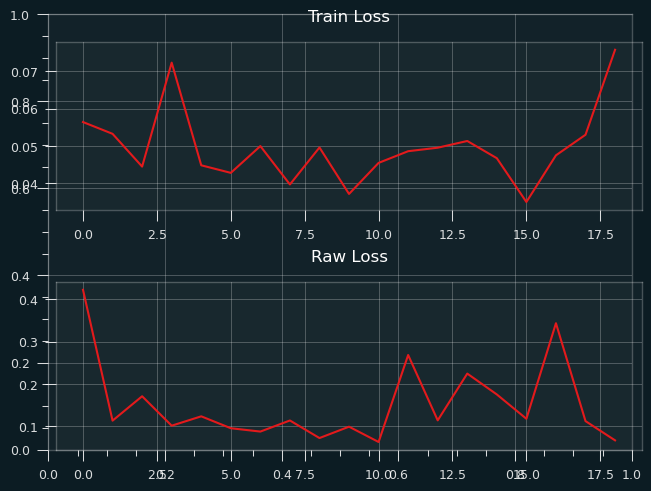

Train:   0%|          | 0/1964 [00:00<?, ?it/s]

KeyboardInterrupt: 

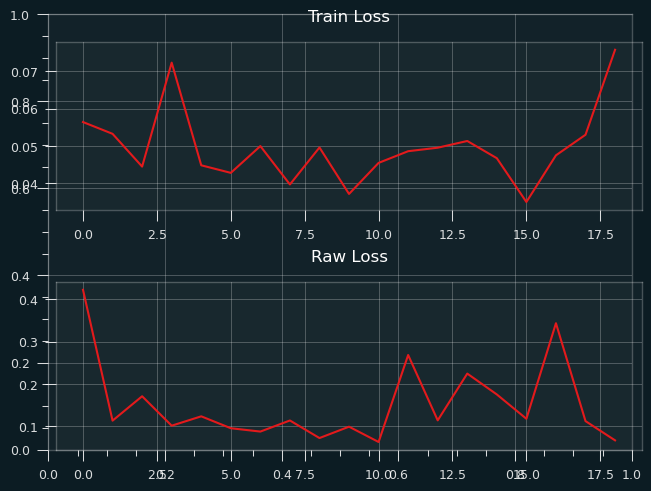

In [13]:
num_epoch = 32
start_epoch = 0
epoch_windows = 250e3 # target 250k windows per epoch
# Display stuff
prog_bar = IntProgress(min=0, max=num_epoch,description='Training Progress',
                       style={'description_width': 'initial'}) # instantiate the bar
display(prog_bar) # display the bar
title_text = IntText(value=0,description='Current Epoch',style={'description_width': 'initial'})
display(title_text)
train_loss_text = FloatText(value=0,description='Current Training Loss',style={'description_width': 'initial'})
display(train_loss_text)
snr_text = FloatText(value=0,description='Current SNR',style={'description_width': 'initial'})
display(snr_text)
spread_text = FloatText(value=0,description='Current Freq Spread',style={'description_width': 'initial'})
display(spread_text)
fig, ax = plt.subplots(2, layout='constrained')
ax[0].set_title('Epoch Loss',fontsize=16)

t0 = time.time()
model.train()
for e in range(start_epoch, num_epoch):
    epoch = e - start_epoch
    # gradually increase noise level and add other signals
    snr_db = 10 # cosine_annealing_schedule(epoch, final_snr_epoch, initial_snr, final_snr)
    freq_spread = 200 # cosine_annealing_schedule(epoch, final_spread_epoch, initial_spread, final_spread)
    multi_signal = 0.5 # if epoch > 10 else 0
    # print(f'Epoch {epoch}: snr: {snr_db}dB multi-signal: {multi_signal}')
    # load datasets with epoch noise and multi-signal params
    train_dir = os.path.join('audio','segments')
    train_dataset = AmDataset(train_dir, aud_window_len, carrier_freq, sr_mod, sr_aud, 
                              max_files=epoch_sz,
                              max_windows=epoch_windows,
                              snr_db=snr_db,
                              multi_signal=multi_signal,
                              carrier_spread=freq_spread,
                              )
    train_loader = DataLoader(train_dataset, batch_size=batch_sz, shuffle=True, 
                            num_workers=0, pin_memory=True, drop_last=True)
    # Update labels
    snr_text.value = snr_db
    spread_text.value = freq_spread
    prog_bar.value += 1
    title_text.value += 1
    losses.append([])
    raw_losses.append([])
    # Run training
    for batch in notebook.tqdm(train_loader, total=len(train_loader), leave=False, desc='Train'):
        if step % eval_iter == 0:
            l = estimate_loss(model, snr_db, multi_signal, freq_spread)
            losses[-1].append({
                'epoch': epoch,
                'iter': step,
                'train/loss': l['train'],
                'val/loss': l['val'],
                'lr': scheduler.get_last_lr(),
                'snr': snr_db,
                'multi_signal': multi_signal,
            })
            if l['val'] < best_val_loss:
                best_val_loss = l['val']
        # forward and backward update
        rx = batch['rx'].to(device)                 # complex [b, n]
        rx = torch.view_as_real(rx).permute(0,2,1)  # [b, 2, n]
        am = batch['am'].to(device)
        target = batch['audio'].to(device)
        
        with autocast():
            audio, recon = model(rx)
            loss_demod = demod_loss_weight * lossfn_demod(audio.view(-1)[None, None, :], target.view(-1)[None, None, :])
        with autocast(enabled=False): # pytorch doesn't support stft on half-precision complex values
            # recon [b, 2, rx_window_len]
            rc = torch.complex(recon[:,0,:].to(torch.float32), recon[:,1,:].to(torch.float32)).view(-1)[None,:]
            ac = am.view(-1)[None,:]
            loss_recon = recon_loss_weight * lossfn_recon(rc, ac)
            loss = loss_recon + loss_demod
        with autocast():
            scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        optimizer.zero_grad(set_to_none=True)
        if step % eval_iter == 0:
            raw_losses[-1].append(loss.item())
        step += 1
    # finished epoch
    epoch_losses = [l['train/loss'] for l in losses[-1]]
    train_loss_text.value = np.array(epoch_losses).mean()
    clear_output(wait=True)
    ax[0].clear()
    ax[1].clear()
    ax[0].set_title('Train Loss')
    ax[1].set_title('Raw Loss')
    ax[0].plot(epoch_losses)
    ax[1].plot(raw_losses[-1])
    # fig.tight_layout()
    display(prog_bar)
    display(title_text)
    display(train_loss_text)
    display(snr_text)
    display(spread_text)
    display(fig)
    # print(f'Finished {len(train_loader)} iterations in {time.time() - t1:.2f} sec ({(time.time() - t1)/len(train_loader):.2f} sec/it)')
    # t1 = time.time()
    # print(f'Best val loss: {best_val_loss} Avg train loss: {np.array(raw_losses[-1]).mean()}')

    # save checkpoint every 4 epochs
    if epoch % 1 == 0:
        checkpoint = {
            'model': model.state_dict(),
            'model_config': model.config,
            'optimizer': optimizer.state_dict(),
            'iter_num': step,
            'best_val_loss': best_val_loss,
        }
        torch.save(checkpoint, os.path.join(out_dir, f'ckpt.pt'))
print(f'finished in {time.time() - t0} sec')

In [18]:
checkpoint = {
    'model': model.state_dict(),
    'model_config': model.config,
    'optimizer': optimizer.state_dict(),
    'iter_num': step,
    'best_val_loss': best_val_loss,
}
torch.save(checkpoint, os.path.join(out_dir, f'model.pt'))

carrier freq: 0


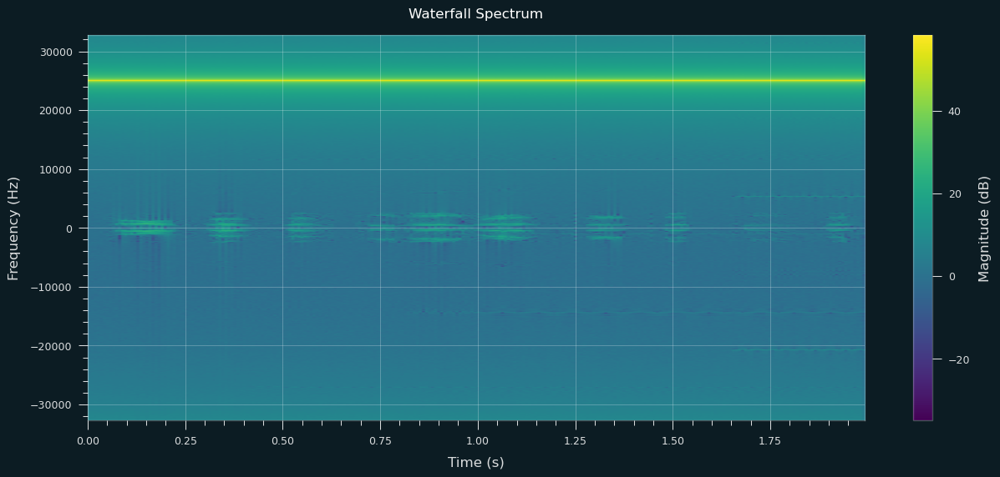

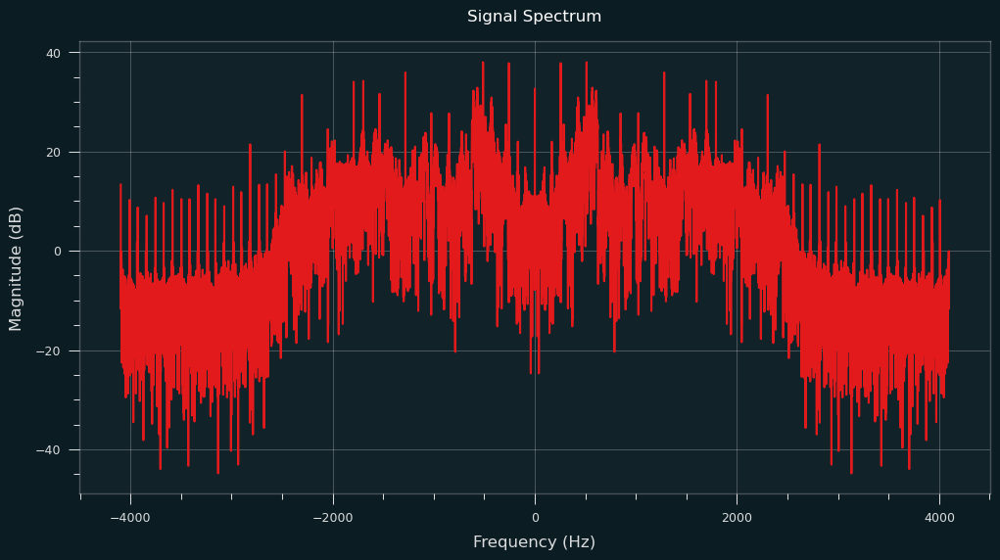

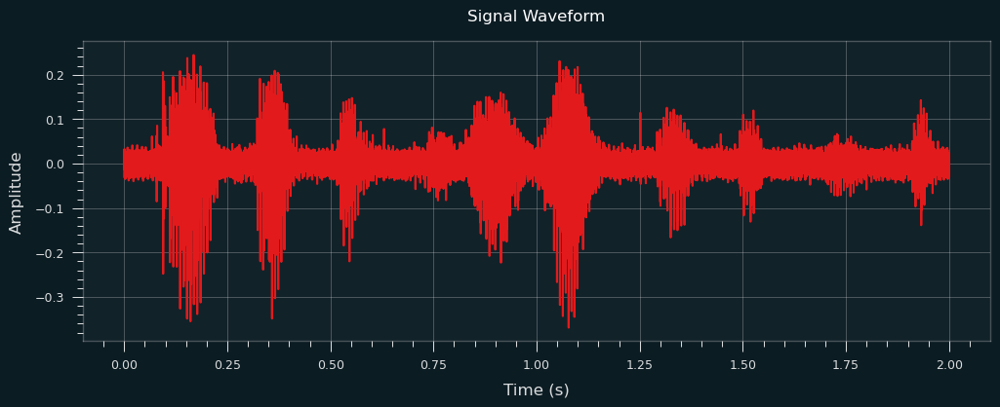

In [11]:
@torch.no_grad()
def test_model(model, snr_db, multi_signal, dir='segments'):
    test_dir = os.path.join('audio',dir)
    test_dataset = AmDataset(test_dir, 
                              aud_window_len, 
                              carrier_freq, 
                              sr_mod, sr_aud, 
                              max_files=1, 
                              snr_db=snr_db, 
                              multi_signal=multi_signal, 
                              eval=True,
                              device=device)
    test_loader = DataLoader(test_dataset, batch_size=batch_sz, shuffle=False, 
                            num_workers=0, pin_memory=False, drop_last=True)
    audio = torch.tensor([], device=device)
    rx = torch.tensor([], device=device)
    output = torch.tensor([], device=device)
    model.eval()
    for batch in test_loader:
        x = batch['rx'].to(device)
        rx = torch.cat((rx, x.view(-1)))
        audio = torch.cat((audio, batch['audio'].view(-1)))
        x = torch.view_as_real(x).permute(0,2,1)
        with autocast():
            a, _ = model(x, eval=True)
        output = torch.cat((output, a.view(-1)))
    output = output.cpu().numpy()
    rx = rx.cpu().numpy()
    audio = audio.cpu().numpy()
    # display
    reference = modulation.demodulate_am(rx, carrier_freq=carrier_freq, sample_rate=sr_mod, audio_sample_rate=sr_aud).cpu().numpy()
    # FFT and spectrogram

    return rx, output, audio
print(f'carrier freq: {carrier_freq}')
rx, output, audio = test_model(model, snr_db=15, multi_signal=True)
plot_waterfall_spectrum(rx, sr_mod)
plot_spectrum(output, sr_aud)
plot_waveform(output, sr_aud)
play_audio(output)

It's working! Try demodulating a real signal

torch.Size([5200000])


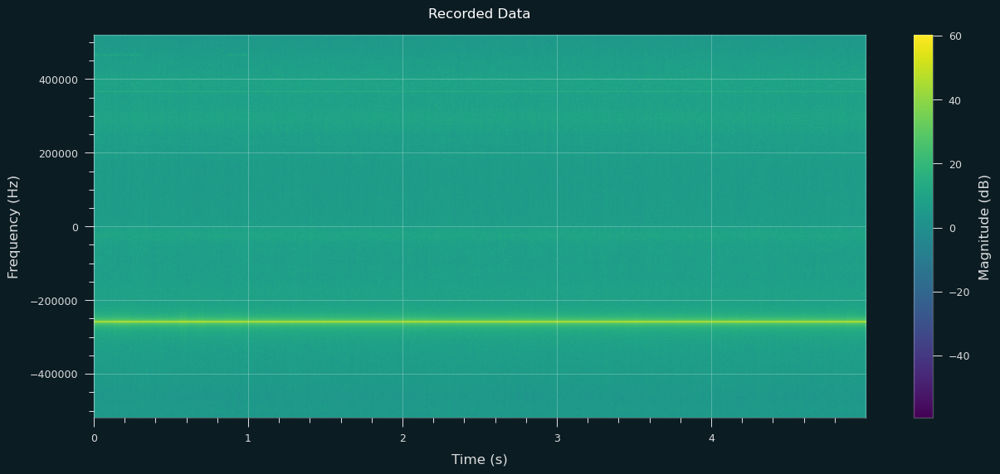

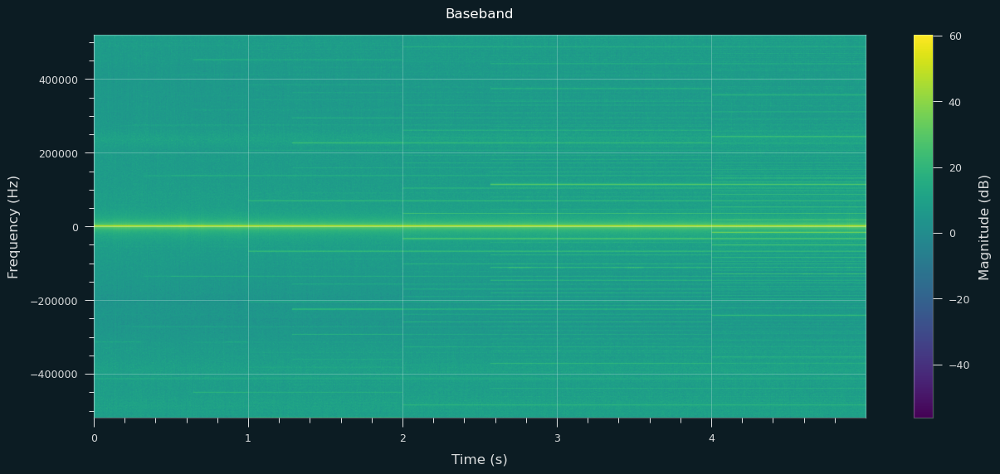

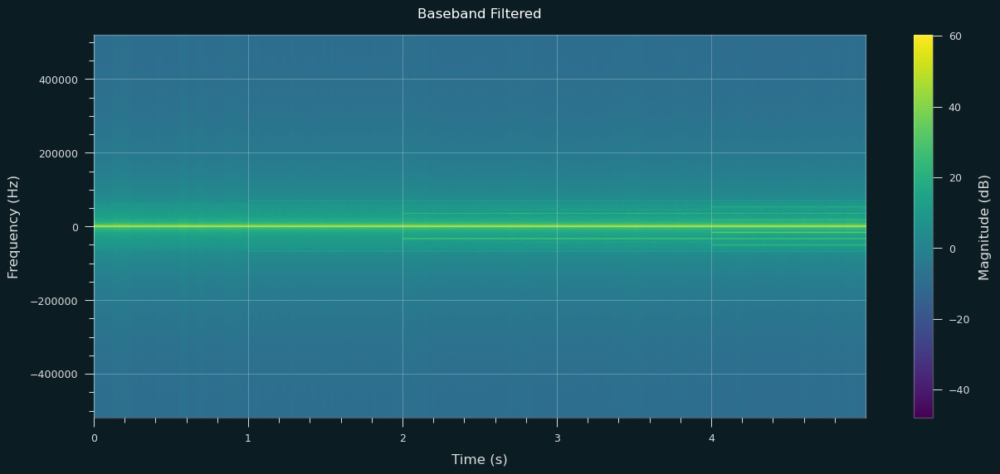

torch.Size([5200000])
decimation: 15


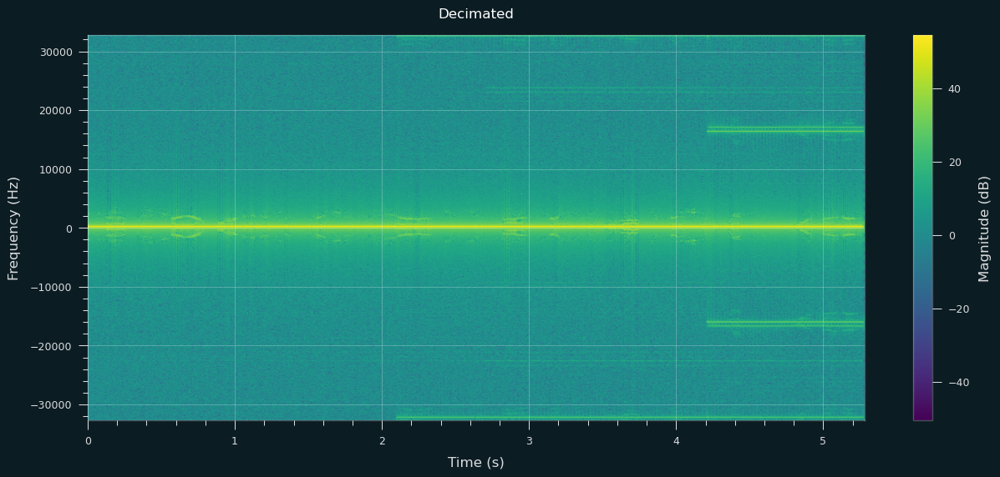

c:\Users\coste\dev\ai\radio\util.py:13: ComplexWarning: Casting complex values to real discards the imaginary part
  norm = np.float32(data / np.max(np.abs(data)))


In [66]:
# Frequencies:
#   ATIS (128.4):  128660000
#   Tower (120.9): 121160000
# Exact sample rate from 2023-02-22 recordings: 1040000.008265 Hz
# Parameters
filename = os.path.join('rx_samples', 'atis.bin')
duration = 5
start_offset = 27

sr_in = 1.04e6
carrier_in = int(sample_rate / 4) * -1 # negative b/c tuner adds positive offset, so signal appears at negative offset

# Load real data
with open(filename, 'rb') as f:
    raw_bytes = np.fromfile(f, dtype=np.uint8, count=int(sr_in * duration * 2), offset=int(sr_in * start_offset * 2))
iq_samples = (raw_bytes - 127.5) / 127.5
i_samples = iq_samples[0::2]
q_samples = iq_samples[1::2]
complex_samples = i_samples + 1j * q_samples
real = torch.tensor(complex_samples, dtype=torch.complex64, device=device)
print(real.shape)
plot_waterfall_spectrum(real.cpu(), sample_rate, title="Recorded Data")
# frequency shift
num_samples = real.size(0)
t = torch.linspace(0, num_samples / sr_in, num_samples, device=device)
downconversion_signal = torch.exp(-2j * math.pi * carrier_in * t)
baseband_signal = real * downconversion_signal
plot_waterfall_spectrum(baseband_signal.cpu(), sr_in, title="Baseband")
# Design and apply anti-aliasing low-pass filter
kernel_size=101
anti_aliasing_cutoff = sr_mod / 2
anti_aliasing_kernel = modulation.design_low_pass_filter(anti_aliasing_cutoff, sr_in, kernel_size, device)
baseband_filtered = modulation.fir_low_pass_filter(baseband_signal.unsqueeze(0).unsqueeze(0), anti_aliasing_kernel.unsqueeze(0).unsqueeze(0), padding='same')
plot_waterfall_spectrum(baseband_filtered.cpu(), sr_in, title="Baseband Filtered")
print(baseband_filtered.shape)
# Decimate to desired sample rate
decimation_factor = int(sr_in // sr_mod)
print(f'decimation: {decimation_factor}')
decimated = baseband_filtered[::decimation_factor]
plot_waterfall_spectrum(decimated.cpu(), sr_mod, title="Decimated")
play_audio(decimated.cpu(), sr_mod)

c:\Users\coste\dev\ai\radio\util.py:96: RuntimeWarning: divide by zero encountered in log10
  waterfall[:, i] = 20 * np.log10(np.abs(fft_shifted))


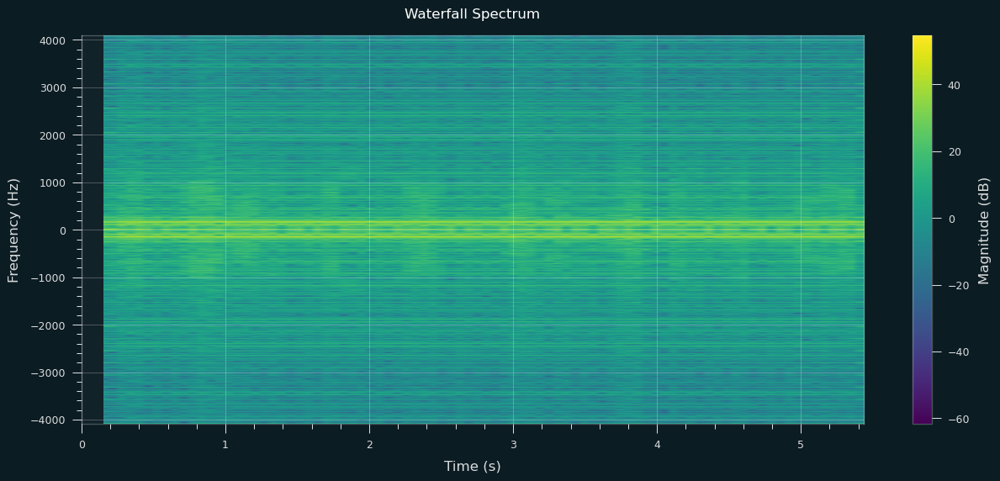

In [67]:
from util import apply_model

real_out = apply_model(model, decimated, batch_sz=batch_sz)
real_out = real_out.cpu().numpy()
plot_waterfall_spectrum(real_out, sr_aud)

play_audio(real_out, sr_aud)